___
## **Acidentes e incidentes graves na aviação civil brasileira**

Principais tarefas executadas:

- Os dados foram carregados e três etapas de análise foram realizadas: Univariada, Bivariada e Multivariada considerando as feature relevantes.

- Os dados dos aeroportos foram incluídos no dataset.

- Testes de hipóteses.

- Informações da internet sobre aeronaves foram utilizadas para ajudar na análise.
___

### Modelo de dados

<img src="img/modelo_de_dados.jpg" width="1200" height="1800" align="center"/>

In [1]:
# Importando bibliotecas

import pandas as pd
import datetime
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from geopy.distance import distance
from plotly.subplots import make_subplots
import seaborn as sns
import scipy.stats as stats

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Mostrando todas as colunas
pd.set_option('display.max_columns', None)

In [3]:
# Carregando dados
aeronave = pd.read_csv('aeronave.csv')
ocorrencia = pd.read_csv('ocorrencia.csv')

### Tabela de ocorrências

| Nome das colunas | Tipo de dados | Chave primária | Chave estrangeira | Código de identificação da ocorrência |
|------------------|---------------|----------------|-------------------|---------------------------------------|
| codigo_ocorrencia|    INT(11)    |        x       |        -          | Código de identificação da ocorrência |
|  classificacao   |  VARCHAR(30)  |        -       |        -          |      Classificação da ocorrência      |
|      tipo        |  VARCHAR(80)  |        -       |        -          |           Tipo da ocorrência          |
|   localidade     |  VARCHAR(100) |        -       |        -          |   Cidade / município onde houve a ocorrência |
| uf               |   VARCHAR(3)  |        -       |        -          |  Estado / província onde houve a ocorrência |
|    pais          |   VARCHAR(80) |        -       |        -          |       País onde houve a ocorrência   |
|  aerodromo       |   VARCHAR(4)  |        -       |        -          |   Código ICAO do aeródromo onde houve a ocorrência |
| dia_ocorrencia   |     DATE      |        -       |        -          |      Data da ocorrência  |
| horario_utc      |     TIME      |        -       |        -          |   Horário da ocorrência no padrão UTC  |
| sera_investigada |   VARCHAR(5)  |        -       |        -          |   Informação se a ocorrência será ou não investigada  |
| comando_investigador |  VARCHAR(15) |     -       |        -          |   Comando investigador responsável pela ocorrência  |
| status_investigacao  |  VARCHAR(10) |     -       |        -          |   Informação se a investigação está ativa ou finalizada  |
|    numero_relatorio  |  VARCHAR(50) |     -       |        -          |   Número de identificação do relatório final de investigação   |
|    Relatorio_publicado   |    VARCHAR(5)  |  -    |        -          |   Informação se o relatório final de investigação foi ou não publicado  |
|    dia_publicacao   |  DATE   |   -    |    -    |   Dia da publicação do relatório final de investigação  |
|    quantidade_recomendacoes  | INT(11) |  -   |  -  |  Quantidade de recomendações de segurança emitidas  |
|    aeronaves_envolvidas      | INT(11) |  -   |  -  | Quantidade de aeronaves envolvidas na ocorrência   |
|    saida_pista  |   INT(11)   |  -  | - | Informação se houve ou não saída de pista na ocorrência  |
|    dia_extracao  |  DATE   |  -  |  -  |  Dia da extração dos dados na base de dados do CENIPA  |

In [4]:
ocorrencia.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2027 entries, 0 to 2026
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   codigo_ocorrencia         2027 non-null   int64  
 1   classificacao             2027 non-null   object 
 2   tipo                      2027 non-null   object 
 3   localidade                2027 non-null   object 
 4   uf                        2027 non-null   object 
 5   pais                      2027 non-null   object 
 6   aerodromo                 2024 non-null   object 
 7   dia_ocorrencia            2027 non-null   object 
 8   horario                   2027 non-null   object 
 9   sera_investigada          2027 non-null   object 
 10  comando_investigador      2027 non-null   object 
 11  status_investigacao       1821 non-null   object 
 12  numero_relatorio          1821 non-null   object 
 13  relatorio_publicado       995 non-null    float64
 14  dia_publ

In [5]:
# Convertendo para datetime

ocorrencia['dia_ocorrencia'] = pd.to_datetime(ocorrencia['dia_ocorrencia'])
ocorrencia['dia_publicacao'] = pd.to_datetime(ocorrencia['dia_publicacao'])
ocorrencia['dia_extracao'] = pd.to_datetime(ocorrencia['dia_extracao'])
ocorrencia['horario'] = pd.to_datetime(ocorrencia['horario'], format='%H:%M:%S')

In [6]:
ocorrencia.head(3)

,codigo_ocorrencia,classificacao,tipo,localidade,uf,pais,aerodromo,dia_ocorrencia,horario,sera_investigada,comando_investigador,status_investigacao,numero_relatorio,relatorio_publicado,dia_publicacao,quantidade_recomendacoes,aeronaves_envolvidas,saida_pista,dia_extracao
0,47965,ACIDENTE,FALHA DO MOTOR EM VOO,ARIQUEMES,RO,BRASIL,SJOG,2013-05-05,1900-01-01 11:00:00,***,SERIPA-7,NaN,NaN,NaN,NaT,0,1,NaN,2016-07-30
1,50313,INCIDENTE GRAVE,POUSO SEM TREM,CACOAL,RO,BRASIL,SSKW,2013-11-25,1900-01-01 12:32:00,SIM,SERIPA-7,FINALIZADA,IG-209/CENIPA/2013,1.0,2014-04-07,0,1,NaN,2016-07-30
2,34078,ACIDENTE,PERDA DE CONTROLE NO SOLO,CEREJEIRAS,RO,BRASIL,****,2008-08-07,1900-01-01 15:10:00,SIM,SERIPA-7,FINALIZADA,A - 517/CENIPA/2016,1.0,2016-07-07,0,1,1.0,2016-07-30


___

### Tabela de aeronaves

|  Nome das colunas  |   Tipo de dados   |  Chave primária  |  Chave estrangeira  |   Comentários  |
|------------------|---------------|----------------|-------------------|---------------------------------------|
|  codigo_aeronave   | INT(11)  |  x  | - | Código de identificação de aeronave |
|  codigo_ocorrencia  |  INT(11)  | - | x | Código de identificação de ocorrência |
| matricula | VARCHAR(10) | -  | - | Matrícula da aeronave |
| codigo_operador | INT(11) | - | - | Código de identificação do operador |
| equipamento | VARCHAR(45) | - | - | Tipo da aeronave |
| fabricante | VARCHAR(45) | - | - | Fabricante da aeronave |
| modelo | VARCHAR(45) | - | - | Modelo da aeronave |
| tipo_motor | VARCHAR(45) | - | - | Tipo de motor da aeronave |
| quantidade_motores | INT(11) | - | - | Quantidade de motores da aeronave |
| peso_maximo_decolagem | FLOAT | - | - | Peso máximo para decolagem | 
| quantidade_assentos | INT(11) | - | - | Quantidade de assentos na aeronave |
| ano_fabricacao | INT(11) | - | - | Ano de fabricação da aeronave |
| pais_registro | VARCHAR(80) | - | - | País de registro da aeronave |
| categoria_registro | VARCHAR(4) | - | - | Categoria de registro da aeronave no momento da ocorrência |
| categoria_aviacao | VARCHAR(15) | - | - | Categoria de aviação da aeronave no momento da ocorrência |
| origem_voo | VARCHAR(4) | - | - | Origem de voo da aeronave | 
| destino_voo | VARCHAR(4) | - | - | Destino de voo da aeronave | 
| fase_operacao | VARCHAR(15) | - | - | Fase de operação da aeronave no momento da ocorrência | 
| tipo_operacao | VARCHAR(20) | - | - | Tipo de operação da aeronave no momento da ocorrência | 
| nivel_dano | VARCHAR(10) | - | - | Nível do dano da aeronave | 
| quantidade_fatalidades | INT(11) | - | - | Quantidade de fatalidades (mortos) na aeronave | 
| dia_extracao | DATE | - | - | Dia da extração dos dados na base de dados do CENIPA |

In [7]:
aeronave.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2043 entries, 0 to 2042
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   codigo_aeronave         2043 non-null   int64  
 1   codigo_ocorrencia       2043 non-null   int64  
 2   matricula               2043 non-null   object 
 3   codigo_operador         2043 non-null   int64  
 4   equipamento             2043 non-null   object 
 5   fabricante              2043 non-null   object 
 6   modelo                  2043 non-null   object 
 7   tipo_motor              2043 non-null   object 
 8   quantidade_motores      2034 non-null   float64
 9   peso_maximo_decolagem   2043 non-null   int64  
 10  quantidade_assentos     2025 non-null   float64
 11  ano_fabricacao          2039 non-null   float64
 12  pais_registro           2043 non-null   object 
 13  categoria_registro      2043 non-null   object 
 14  categoria_aviacao       2043 non-null   

In [8]:
# Convertendo para datetime

aeronave['dia_extracao'] = pd.to_datetime(aeronave['dia_extracao'])

In [9]:
aeronave.head(3)

,codigo_aeronave,codigo_ocorrencia,matricula,codigo_operador,equipamento,fabricante,modelo,tipo_motor,quantidade_motores,peso_maximo_decolagem,quantidade_assentos,ano_fabricacao,pais_registro,categoria_registro,categoria_aviacao,origem_voo,destino_voo,fase_operacao,tipo_operacao,nivel_dano,quantidade_fatalidades,dia_extracao
0,4,45602,PPGXE,241,AVIÃO,NEIVA INDUSTRIA AERONAUTICA,56-C,PISTÃO,1.0,660,2.0,1962.0,BRASIL,PRI,INSTRUÇÃO,SDPW,SDPW,INDETERMINADA,INSTRUÇÃO,SUBSTANCIAL,NaN,2016-07-30
1,40,53551,PPGSZ,160,AVIÃO,NEIVA INDUSTRIA AERONAUTICA,56-C,PISTÃO,1.0,660,2.0,1960.0,BRASIL,PRI,INSTRUÇÃO,SBBP,SBBP,DECOLAGEM,INSTRUÇÃO,LEVE,NaN,2016-07-30
2,118,43721,PTCMT,1232,AVIÃO,BEECH AIRCRAFT,95-B55,PISTÃO,2.0,2310,6.0,1966.0,BRASIL,TPX,TÁXI AÉREO,****,****,CORRIDA APÓS POUSO,TÁXI AÉREO,SUBSTANCIAL,NaN,2016-07-30


In [10]:
# Checando dimensões dos datasets

aeronave.shape, ocorrencia.shape

((2043, 22), (2027, 19))

___
### Checando valores nulos dos conjuntos de dados

- Transformando células com asteriscos para NaN

In [11]:
# Transformar os asteriscos em NaN

def contem_letra(valor):
    if isinstance(valor, str):
        return any(c.isalpha() | c.isdigit() for c in valor)
    else:
        return False
    
def sub_asteriscos(x):
    
    # células que não possuem letras, float ou int são transformadas em valor nula. ex: **** e ***
    if not isinstance(x, (float, int, pd.Timestamp)):
        cl = contem_letra(x)
        if not cl:
            x = np.nan
            return x
        else:
            return x
    elif isinstance(x, (float, int, pd.Timestamp)):
        return x
    else:
        return x

In [12]:
for i in list(aeronave.columns):
    aeronave[i] = aeronave[i].apply(lambda x: sub_asteriscos(x))
    
for j in list(ocorrencia.columns):
     ocorrencia[j] = ocorrencia[j].apply(lambda x: sub_asteriscos(x))

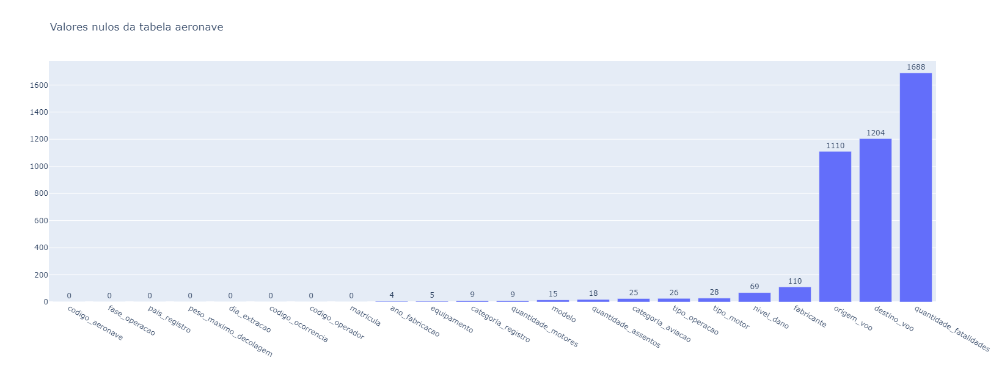

In [13]:
aeronave_null = pd.DataFrame(aeronave.isnull().sum()).reset_index().rename(columns={0:'nulos'}).sort_values('nulos')

fig = go.Figure(data=[go.Bar(
            y=aeronave_null['nulos'], x=aeronave_null['index'],
            text=aeronave_null['nulos'],
        )])

fig.update_traces(textposition='outside')

fig.update_layout(width=800, height=600, title='Valores nulos da tabela aeronave')

fig.show()

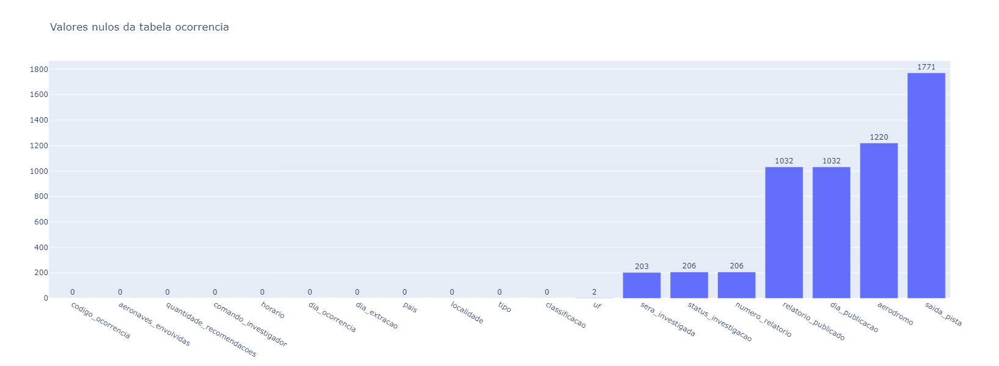

In [14]:
ocorrencia_null = pd.DataFrame(ocorrencia.isnull().sum()).reset_index().rename(columns={0:'nulos'}).sort_values('nulos')

fig = go.Figure(data=[go.Bar(
            y=ocorrencia_null['nulos'], x=ocorrencia_null['index'],
            text=ocorrencia_null['nulos'],
        )])

fig.update_traces(textposition='outside')

fig.update_layout(width=800, height=600, title='Valores nulos da tabela ocorrencia')

fig.show()

___
### Aeroportos
###  https://github.com/mwgg/Airports

### O que é IATA?
### IATA é a sigla inglesa de International Air Transport Association ou Associação Internacional de Transportes Aéreos, em português. A IATA foi criada há mais de 60 anos por um grupo de companhias aéreas, com o objetivo de representá-las em todos os assuntos relacionados à aviação.

### O que é ICAO?
### A ICAO (sigla em inglês para Organização da Aviação Civil Internacional) criou um código de 4 letras exclusivo para cada aeroporto, visando padronizar e facilitar a identificação. A 1ª letra designa a região ICAO (S para a América do Sul), a 2ª informa o país (B/D/I/J/N/S/W estão ### reservadas para o Brasil) e as outras duas letras completam o código do aeroporto propriamente dito. Todos os aeroportos com código começado por SB produzem METAR – informe meteorológico regular. A IATA (sigla em inglês para Associação Internacional de Transportes Aéreos) também criou um ### código de 3 letras com a mesma finalidade (nesse caso, representando destinos de companhias áreas membros da associação).

In [15]:
import json
with open('airports.json') as data_file:    
    data = json.load(data_file)
    icao_list = [] 
    iata_list = [] 
    elevation_list = []
    lat_list = []
    lon_list = []
    
for i in data.items():
    icao_list.append(i[1]['icao'])
    iata_list.append(i[1]['iata'])
    elevation_list.append(i[1]['elevation'])   
    lat_list.append(i[1]['lat'])
    lon_list.append(i[1]['lon'])    

aeroportos = pd.DataFrame({'icao': icao_list,
                          'iata': iata_list,
                          'elevation': elevation_list,
                          'lat': lat_list,
                          'lon': lon_list})

In [16]:
aeronave1 = pd.merge(aeronave, aeroportos, left_on='origem_voo', right_on='icao', how='left').rename(columns={'lat':'lat_origem', 'lon': 'lon_origem', 'elevation': 'elevation_origem'})
aeronave2 = pd.merge(aeronave1, aeroportos, left_on='destino_voo', right_on='icao', how='left').rename(columns={'lat':'lat_destino', 'lon': 'lon_destino', 'elevation': 'elevation_destino'})
aeronave = aeronave2.drop(['icao_y', 'iata_y'], axis=1).rename(columns={'icao_x': 'icao', 'iata_x': 'iata'})

In [17]:
def calcula_distancia(row):  
    if not (pd.isna(row['lat_origem']) or pd.isna(row['lon_origem']) or pd.isna(row['lat_destino']) or pd.isna(row['lon_destino'])):
        coordenada1 = (row['lat_origem'], row['lon_origem'])
        coordenada2 = (row['lat_destino'], row['lon_destino'])
        distancia  = distance(coordenada1, coordenada2).km
        return distancia
    else:
        return np.nan

aeronave['distancia'] = aeronave.apply(lambda row: calcula_distancia(row), axis=1)

### Realizando o join das tabelas

In [18]:
aeronave_ocorrencia = pd.merge(aeronave, ocorrencia, on='codigo_ocorrencia')

In [19]:
aeronave_ocorrencia = aeronave_ocorrencia.drop('dia_extracao_y', axis=1)
aeronave_ocorrencia = aeronave_ocorrencia.rename(columns={'dia_extracao_x': 'dia_extracao'})

In [20]:
aeronave_ocorrencia['mes_ocorrencia'] = aeronave_ocorrencia['dia_ocorrencia'].dt.month
aeronave_ocorrencia['ano_ocorrencia'] = aeronave_ocorrencia['dia_ocorrencia'].dt.year

In [21]:
def plot_missing_values(df: pd.DataFrame, width: int, height: int) -> None:
    # https://towardsdatascience.com/handling-missing-data-in-python-c1ffe6e0f325
    # Data Manipulation to Create a Dataframe and Chart Outputting Null and Not Null Value Counts
    # Determine the null values:
    dfNullVals = df.isnull().sum().to_frame()
    dfNullVals = dfNullVals.rename(columns = {0:'Nulo'})
    # Determine the not null values:
    dfNotNullVals = df.notna().sum().to_frame()
    dfNotNullVals = dfNotNullVals.rename(columns = {0:'Não nulo'})
    # Combine the dataframes:
    dfNullCount = pd.concat([dfNullVals, dfNotNullVals], ignore_index=False, axis=1).reset_index()
    dfNullCount = dfNullCount.rename(columns = {'index':'Categoria'})
    # Generate Plot
    fig = px.bar(dfNullCount, y="Categoria", x = ['Não nulo', 'Nulo'], width=width, height=height)
    fig.update_yaxes(categoryorder='total descending')
    fig.update_layout(
        title={'text':"Visualização dos valores nulos",
               'xanchor':'center',
               'yanchor':'top',
               'x':0.5},
        xaxis_title = "Contagem",
        yaxis_title = "Categoria")
    fig.update_layout(legend_title_text = 'Status')
    fig.show()

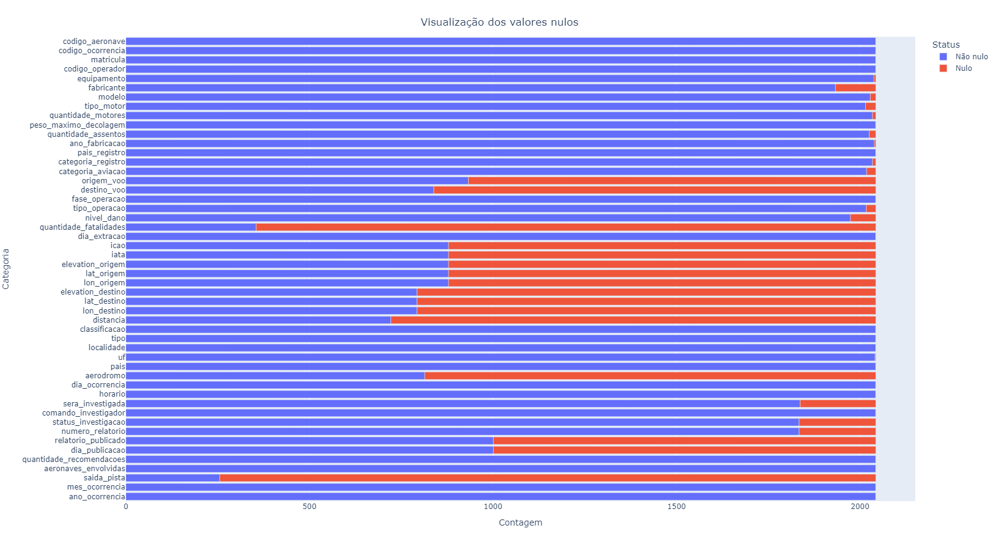

In [22]:
plot_missing_values(aeronave_ocorrencia, 1000, 900)

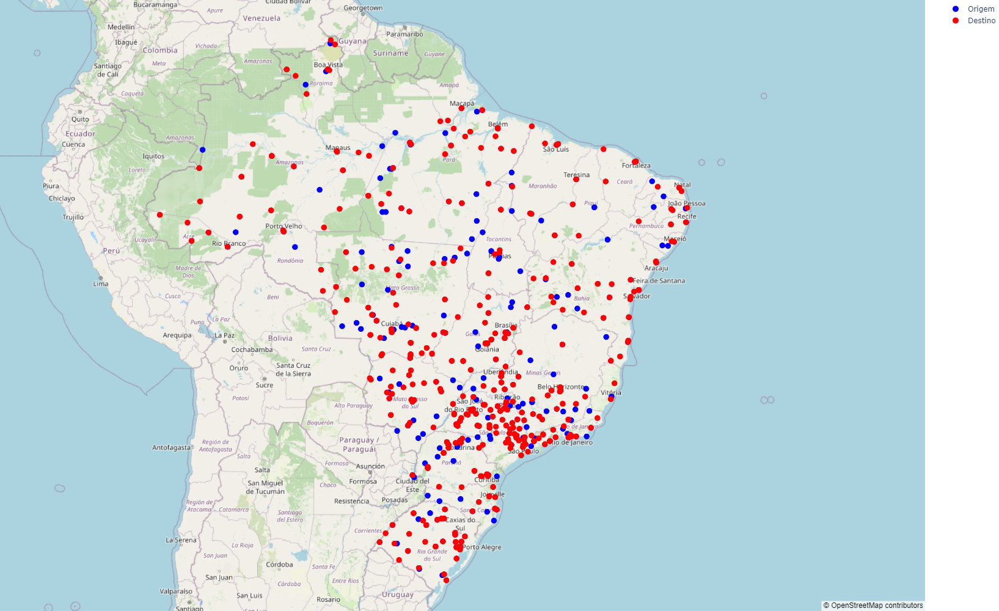

In [23]:
# Crie uma figura com a função go.Figure()
fig = go.Figure()

# Adicione um trace para cada conjunto de dados usando a função go.Scattermapbox()
fig.add_trace(go.Scattermapbox(
    lat=aeronave_ocorrencia['lat_origem'],
    lon=aeronave_ocorrencia['lon_origem'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=10,
        color='blue',
    ),
    name='Origem'
))

fig.add_trace(go.Scattermapbox(
    lat=aeronave_ocorrencia['lat_destino'],
    lon=aeronave_ocorrencia['lon_destino'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=10,
        color='red',
    ),
    name='Destino'
))

fig.update_layout(mapbox_style='open-street-map', mapbox_zoom=4,  mapbox_center_lat = -13,
    margin={"r":0,"t":0,"l":0,"b":0}, showlegend=True, height=1000, width=1200,
    mapbox=dict(
        center=dict(
            lat=-14,
            lon=-51
        ),))

# Exiba o mapa usando a função show()
fig.show()

___

### Verificando colunas com valores constantes o quasi-contantes

In [24]:
for i in list(aeronave_ocorrencia.columns):
    if aeronave_ocorrencia[i].nunique() < 4:
        print(i)

dia_extracao
classificacao
sera_investigada
status_investigacao
relatorio_publicado
aeronaves_envolvidas
saida_pista


In [25]:
aeronave_ocorrencia['dia_extracao'].value_counts(dropna=False, normalize=True)

2016-07-30    1.0
Name: dia_extracao, dtype: float64

In [26]:
for j in list(aeronave_ocorrencia.columns):
    if aeronave_ocorrencia[j].nunique() < 4:
        print(j)

dia_extracao
classificacao
sera_investigada
status_investigacao
relatorio_publicado
aeronaves_envolvidas
saida_pista


In [27]:
aeronave_ocorrencia['dia_extracao'].value_counts(dropna=False, normalize=True)

2016-07-30    1.0
Name: dia_extracao, dtype: float64

In [28]:
aeronave_ocorrencia['classificacao'].value_counts(dropna=False, normalize=True)

ACIDENTE           0.726383
INCIDENTE GRAVE    0.273617
Name: classificacao, dtype: float64

In [29]:
aeronave_ocorrencia['sera_investigada'].value_counts(dropna=False, normalize=True)

SIM    0.897210
NaN    0.100832
NÃO    0.001958
Name: sera_investigada, dtype: float64

In [30]:
aeronave_ocorrencia['status_investigacao'].value_counts(dropna=False, normalize=True)

FINALIZADA    0.521292
ATIVA         0.375918
NaN           0.102301
REABERTA      0.000489
Name: status_investigacao, dtype: float64

In [31]:
aeronave_ocorrencia['relatorio_publicado'].value_counts(dropna=False, normalize=True)

NaN    0.510034
1.0    0.487029
0.0    0.002937
Name: relatorio_publicado, dtype: float64

In [32]:
aeronave_ocorrencia['aeronaves_envolvidas'].value_counts(dropna=False, normalize=True)

1    0.985316
2    0.012726
4    0.001958
Name: aeronaves_envolvidas, dtype: float64

In [33]:
aeronave_ocorrencia['saida_pista'].value_counts(dropna=False, normalize=True)

NaN    0.874694
1.0    0.121390
0.0    0.003916
Name: saida_pista, dtype: float64

___
# Análise Univariada

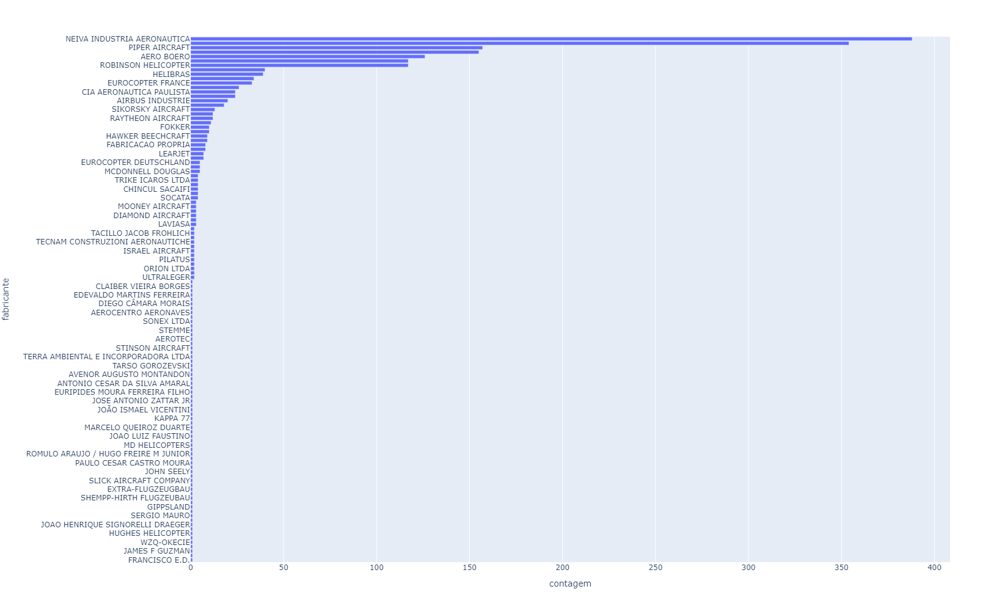

In [34]:
fabricantes = aeronave_ocorrencia.groupby("fabricante").count()['codigo_aeronave'].reset_index().sort_values('codigo_aeronave').rename(columns={'codigo_aeronave':'contagem'})

# criar o histograma com countplot
fig = px.bar(fabricantes, x='contagem', y='fabricante')

# Set the size of the chart
fig.update_layout(width=1800, height=1000)

# mostrar a figura
fig.show()

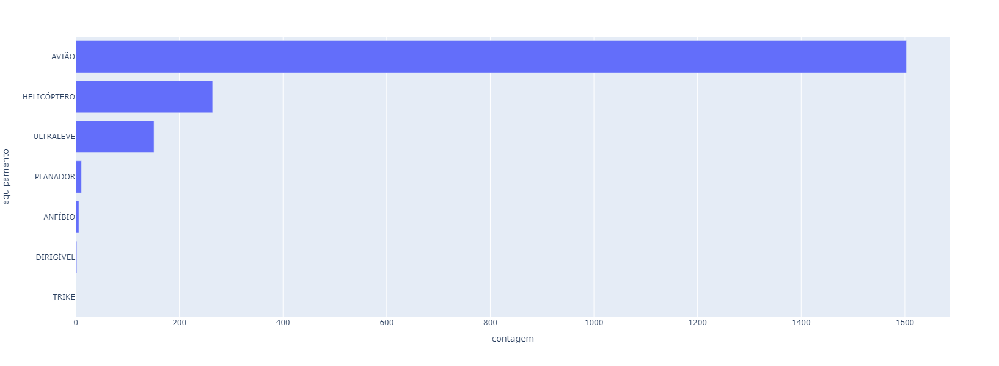

In [35]:
equipamento = aeronave_ocorrencia.groupby("equipamento").count()['codigo_aeronave'].reset_index().sort_values('codigo_aeronave').rename(columns={'codigo_aeronave':'contagem'})

# criar o histograma com countplot
fig = px.bar(equipamento, x='contagem', y='equipamento')

# Set the size of the chart
fig.update_layout(width=800, height=600)

# mostrar a figura
fig.show()

### - O motor a pistão também chamado de motor convencional é econômico, possui grande durabilidade, leveza e baixíssimo custo de operação comparado aos demais.
### Isso justifica o fato de ser o motor com maior quantidade de incidentes, pois é o mais utilizado nas aeronaves.

Fonte: https://www.youtube.com/watch?v=Ot5Cp_Fd_r8

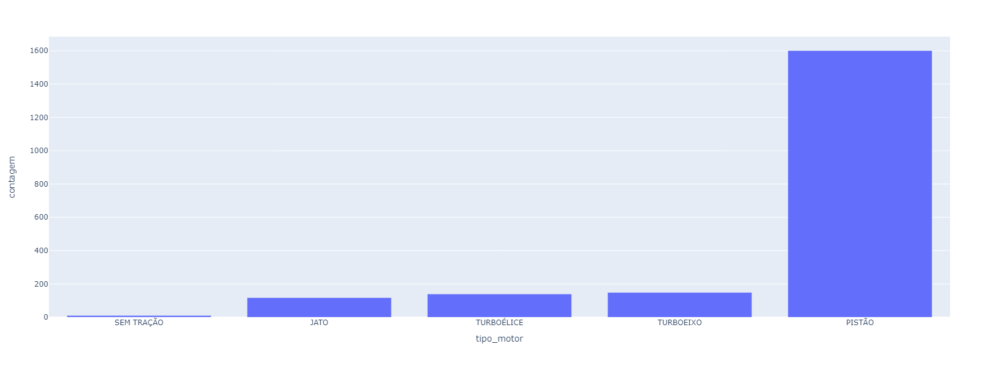

In [36]:
tipo_motor = aeronave_ocorrencia.groupby("tipo_motor").count()['codigo_aeronave'].reset_index().sort_values('codigo_aeronave').rename(columns={'codigo_aeronave':'contagem'})

# criar o histograma com countplot
fig = px.bar(tipo_motor, y='contagem', x='tipo_motor')

# Set the size of the chart
fig.update_layout(width=800, height=600)

# mostrar a figura
fig.show()

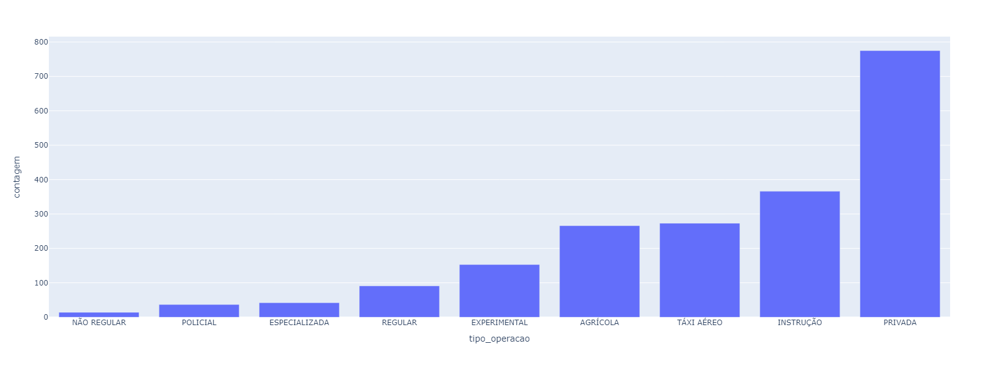

In [37]:
tipo_operacao = aeronave_ocorrencia.groupby("tipo_operacao").count()['codigo_aeronave'].reset_index().sort_values('codigo_aeronave').rename(columns={'codigo_aeronave':'contagem'})

# criar o histograma com countplot
fig = px.bar(tipo_operacao, y='contagem', x='tipo_operacao')

# Set the size of the chart
fig.update_layout(width=800, height=600)

# mostrar a figura
fig.show()

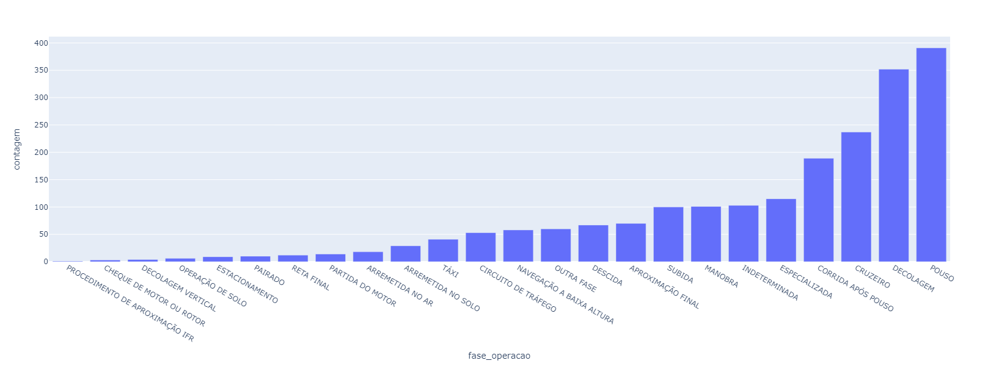

In [38]:
fase_operacao = aeronave_ocorrencia.groupby("fase_operacao").count()['codigo_aeronave'].reset_index().sort_values('codigo_aeronave').rename(columns={'codigo_aeronave':'contagem'})

# criar o histograma com countplot
fig = px.bar(fase_operacao, y='contagem', x='fase_operacao')

# Set the size of the chart
fig.update_layout(width=800, height=600)

# mostrar a figura
fig.show()

### Se somarmos as 3 principais causas de acidente chegamos a praticamente 50% das causas de acidentes

- Falha do motor = 18.45%
- Perda de controle no solo = 15.91%
- Perda de controle em voo = 15.22%

### Total = 49.58%

In [39]:
def nuvem_palavras(df: pd.DataFrame, col:str, stop_words: list):
    palavras = df.dropna(subset=col, axis=0)[col]
    
    todas_palavras = " ".join(s for s in palavras)
    stopwords = set(STOPWORDS)
    stopwords.update(stop_words)
    
    wordcloud = WordCloud(stopwords=stopwords,
                          background_color="black", 
                          width=1600, height=800).generate(todas_palavras)
    
    fig, ax = plt.subplots(figsize=(15,9))
    ax.imshow(wordcloud, interpolation="bilinear")
    ax.set_axis_off()

In [40]:
round(aeronave_ocorrencia['tipo'].value_counts(normalize=True)*100,2)

FALHA DO MOTOR EM VOO                             18.45
PERDA DE CONTROLE NO SOLO                         15.91
PERDA DE CONTROLE EM VOO                          15.22
COLISÃO EM VOO COM OBSTÁCULO                       6.95
COM TREM DE POUSO                                  6.36
OUTROS TIPOS                                       4.26
PANE SECA                                          3.62
FALHA DE SISTEMA / COMPONENTE                      2.99
INDETERMINADA                                      2.79
POUSO SEM TREM                                     2.64
POUSO EM LOCAL NÃO PREVISTO                        2.15
COLISÃO COM OBSTÁCULO NO SOLO                      1.96
POUSO BRUSCO                                       1.96
POUSO LONGO                                        1.47
CAUSADO POR FENÔMENO METEOROLÓGICO EM VOO          1.32
PERDA DE COMPONENTE EM VOO                         1.32
CFIT - COLISÃO EM VOO CONTROLADO COM O TERRENO     1.03
MANOBRAS A BAIXA ALTURA                         

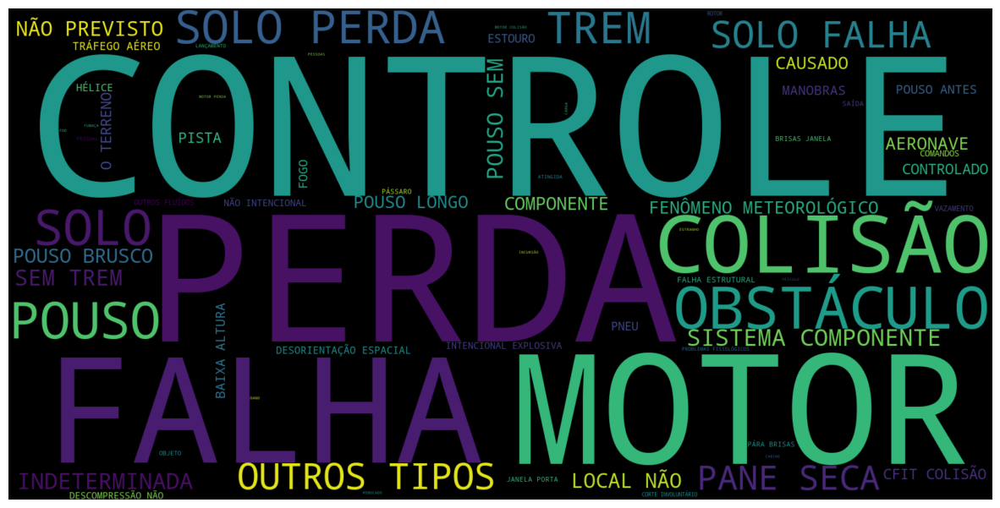

In [41]:
stop_words = ["da", "a", "de", "na", "em", "por", "com", "no", "voo"]
nuvem_palavras(aeronave_ocorrencia, 'tipo', stop_words)

### Verificando-se as falhas de motor em voo, observou-se casos que consta a quantidade de motores igual a zero. Quando olha-se esses casos e atráves de uma pesquisa na internet, pode-se detectar que são aviões com assentos.

In [42]:
pd.crosstab(aeronave_ocorrencia[aeronave_ocorrencia['tipo'] == 'FALHA DO MOTOR EM VOO']['quantidade_motores'], aeronave_ocorrencia[aeronave_ocorrencia['tipo'] == 'FALHA DO MOTOR EM VOO']['tipo'])

tipo,FALHA DO MOTOR EM VOO
quantidade_motores,
0.0,5
1.0,314
2.0,57


In [43]:
pd.crosstab(aeronave_ocorrencia[aeronave_ocorrencia['tipo'] == 'FALHA DO MOTOR EM VOO']['quantidade_motores'], aeronave_ocorrencia[aeronave_ocorrencia['tipo'] == 'FALHA DO MOTOR EM VOO']['equipamento'])

equipamento,ANFÍBIO,AVIÃO,HELICÓPTERO,ULTRALEVE
quantidade_motores,,,,
0.0,0,2,0,2
1.0,1,254,34,25
2.0,0,56,1,0


In [44]:
pd.DataFrame(aeronave_ocorrencia['quantidade_assentos'].value_counts()).reset_index().sort_values('index').rename(columns={'index':'quantidade de assentos', 'quantidade_assentos': 'contagem'}).head()

,quantidade de assentos,contagem
5,0.0,83
2,1.0,328
0,2.0,444
7,3.0,48
3,4.0,320


### Qual seria o motivo de 83 aeronaves sem assentos?

In [45]:
pd.DataFrame(aeronave_ocorrencia[aeronave_ocorrencia['quantidade_assentos'] == 0.0][['equipamento', 'modelo', 'fabricante']].value_counts())

0
equipamento modelo           fabricante                                
ULTRALEVE   ULTRALEVE        MAULE AIRCRAFT                           3
            EXPERIMENT       FABRICACAO PROPRIA                       3
AVIÃO       210              CESSNA AIRCRAFT                          3
            EMB-505          EMBRAER                                  2
            172N             CESSNA AIRCRAFT                          2
            767-322          BOEING COMPANY                           2
            A340-541         AIRBUS INDUSTRIE                         2
            58               BEECH AIRCRAFT                           2
            PA-WNE           PIPER AIRCRAFT                           1
            PA34-200         PIPER AIRCRAFT                           1
            PA34             PIPER AIRCRAFT                           1
            PA-34-220T       PIPER AIRCRAFT                           1
            PA-42            PIPER AIRCRAFT                           1
            RANS S-10-AVIAO  FABRICACAO PROPRIA                       1
            PA-34-200        PIPER AIRCRAFT                           1
            PA-23            PIPER AIRCRAFT                           1
            MD82             MCDONNELL DOUGLAS                        1
            R182             CESSNA AIRCRAFT                          1
            T206H            CESSNA AIRCRAFT                          1
            RV-10            FLYER INDUSTRIA AERONAUTICA LTDA         1
            RV6              FLYER INDUSTRIA AERONAUTICA LTDA         1
            G58              BEECH AIRCRAFT                           1
            T210L            CESSNA AIRCRAFT                          1
            TU206G           CESSNA AIRCRAFT                          1
HELICÓPTERO 206              BELL HELICOPTER                          1
            EC 225 LP        EUROCOPTER FRANCE                        1
PLANADOR    NIMBUS 3D PLAN.  SHEMPP-HIRTH FLUGZEUBAU                  1
ULTRALEVE   BRAVO 700        AEROBRAVO LTDA                           1
            CONQUEST 180 LSA INPAER INDUSTRIA PAULISTA E AERONÁUTICA  1
            FOX V5 SUPER     FABRICACAO PROPRIA                       1
            TRIKE            FABRICACAO PROPRIA                       1
AVIÃO       MD11             MCDONNELL DOUGLAS                        1
            100              BEECH AIRCRAFT                           1
            EMB145           EMBRAER                                  1
            767-328          BOEING COMPANY                           1
            150M             CESSNA AIRCRAFT                          1
            152              CESSNA AIRCRAFT                          1
            182A             CESSNA AIRCRAFT                          1
            182T             CESSNA AIRCRAFT                          1
            210L             CESSNA AIRCRAFT                          1
            210M             CESSNA AIRCRAFT                          1
            210N             CESSNA AIRCRAFT                          1
            402B             CESSNA AIRCRAFT                          1
            525              CESSNA AIRCRAFT                          1
            747-312M         BOEING COMPANY                           1
            767-3P6          BOEING COMPANY                           1
            114              ROCKWELL                                 1
            95-B55           BEECH AIRCRAFT                           1
            A-37B            CESSNA AIRCRAFT                          1
            A330-243         AIRBUS INDUSTRIE                         1
            A340             AIRBUS INDUSTRIE                         1
            A35              BEECH AIRCRAFT                           1
            A36              BEECH AIRCRAFT                           1
            C206             CESSNA AIRCRAFT                          1
            CMA              FABRICACA

<img src="img/0_assentos.jpg" width="1200" height="1800" align="center"/>

___
# Análise Bivariada

In [46]:
pd.crosstab(aeronave_ocorrencia.pais_registro, aeronave_ocorrencia.nivel_dano, dropna=False)

nivel_dano,DESTRUÍDA,LEVE,NENHUM,SUBSTANCIAL
pais_registro,,,,
ALEMANHA,1,0,0,0
ANGOLA,0,0,0,1
ARGENTINA,0,0,1,0
ARÁBIA SAUDITA,1,0,0,0
BRASIL,342,255,162,1175
ESPANHA,0,0,1,0
ESTADOS UNIDOS,3,3,2,13
NÃO IDENTIFICADO,1,0,0,0
PARAGUAI,3,0,1,3


In [47]:
pd.crosstab(aeronave_ocorrencia.status_investigacao, aeronave_ocorrencia.nivel_dano, dropna=False)

nivel_dano,DESTRUÍDA,LEVE,NENHUM,SUBSTANCIAL
status_investigacao,,,,
ATIVA,120,120,97,382
FINALIZADA,178,119,58,693
REABERTA,0,0,1,0


### Os meses da baixa temporada com passagens mais baratas são março, abril e agosto. Já a alta temporada ocorre em janeiro, julho e dezembro. Entre setembro e novembro, é possível encontrar voos baratos, mas deve haver atenção quanto aos feriados, que encarecem os voos.

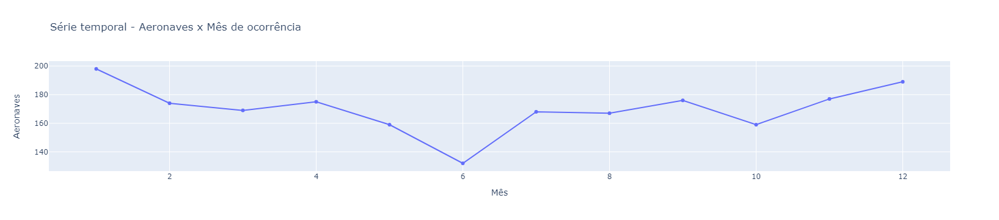

In [48]:
time_series = aeronave_ocorrencia.groupby(['codigo_aeronave', 'mes_ocorrencia']).count().reset_index()[['mes_ocorrencia', 'codigo_ocorrencia']].rename(columns={'codigo_ocorrencia':'count'}).groupby('mes_ocorrencia').sum().reset_index()

# criar objeto de traço
trace = go.Scatter(y=time_series['count'], x=time_series['mes_ocorrencia'], text=time_series['count'])

# criar objeto de layout
layout = go.Layout(title='Série temporal - Aeronaves x Mês de ocorrência',
                   xaxis=dict(title='Mês'),
                   yaxis=dict(title='Aeronaves'))

# criar objeto de figura
fig = go.Figure(data=[trace], layout=layout)

# renderizar o gráfico
fig.show()

#### Decomposição da série temporal

In [49]:
time_series.index = time_series['mes_ocorrencia']
time_series.drop('mes_ocorrencia', axis=1, inplace=True)

In [50]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [51]:
resultado = seasonal_decompose(time_series, model='multiplicative', period=2)

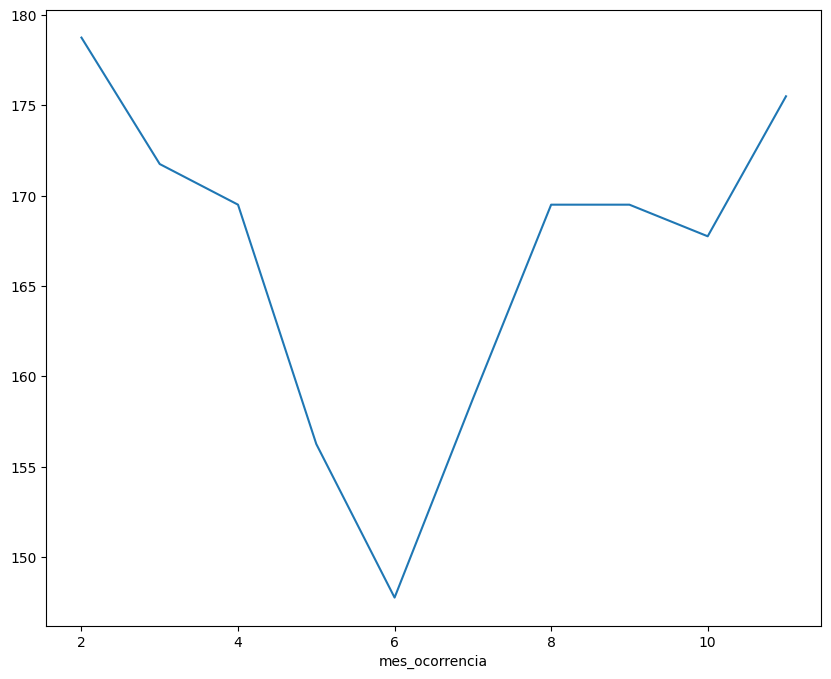

In [52]:
plt.figure(figsize=(10,8))
resultado.trend.plot()
plt.show()

### Número de passageiros aéreos cresceu 210% de 2000 a 2014, diz CNT

https://www.correiobraziliense.com.br/app/noticia/turismo/2015/11/11/interna_turismo,506012/numero-de-passageiros-aereos-cresceu-210-de-2000-a-2014-diz-cnt.shtml

### Baseado nisso pode-se avaliar que o crescimento de passageiros e de aeronaves tenha gerado um crescimento nos acidentes também. A série temporal mostra um crescimento entre 2006 e 2012

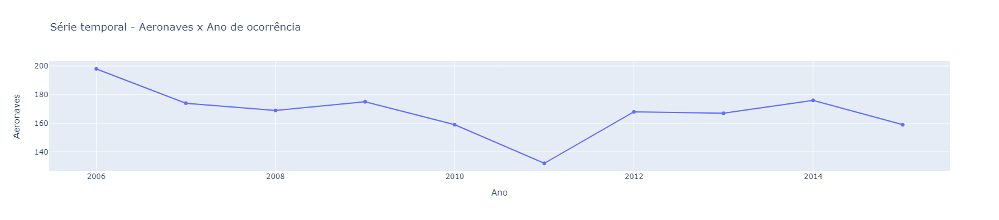

In [53]:
time_series2 = aeronave_ocorrencia.groupby(['codigo_aeronave', 'ano_ocorrencia']).count().reset_index()[['ano_ocorrencia', 'codigo_ocorrencia']].rename(columns={'codigo_ocorrencia':'count'}).groupby('ano_ocorrencia').sum().reset_index()

# criar objeto de traço
trace = go.Scatter(y=time_series['count'], x=time_series2['ano_ocorrencia'], text=time_series2['count'])

# criar objeto de layout
layout = go.Layout(title='Série temporal - Aeronaves x Ano de ocorrência',
                   xaxis=dict(title='Ano'),
                   yaxis=dict(title='Aeronaves'))

# criar objeto de figura
fig = go.Figure(data=[trace], layout=layout)

# renderizar o gráfico
fig.show()

#### Decomposição da série temporal

In [54]:
time_series2.index = time_series2['ano_ocorrencia']
time_series2.drop('ano_ocorrencia', axis=1, inplace=True)

In [55]:
resultado2 = seasonal_decompose(time_series2, model='multiplicative', period=1)

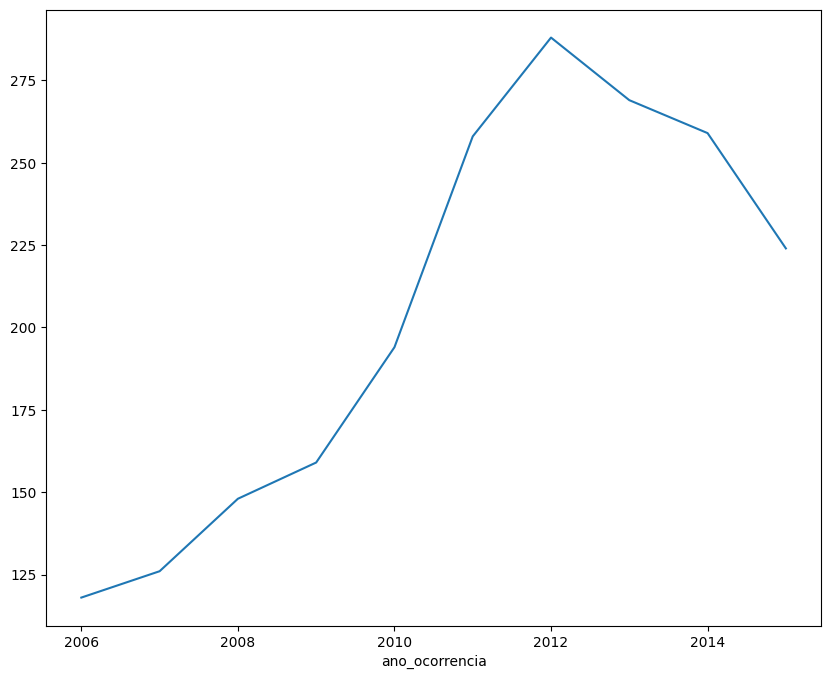

In [56]:
plt.figure(figsize=(10,8))
resultado2.trend.plot()
plt.show()

#### Nível de dano X Elevation origem

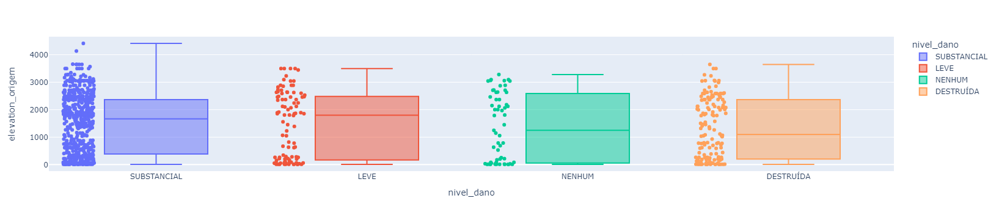

In [57]:
fig = px.box(aeronave_ocorrencia, x="nivel_dano", y="elevation_origem", points='all', color="nivel_dano")
fig.show()

#### Nível de dano X Elevation destino

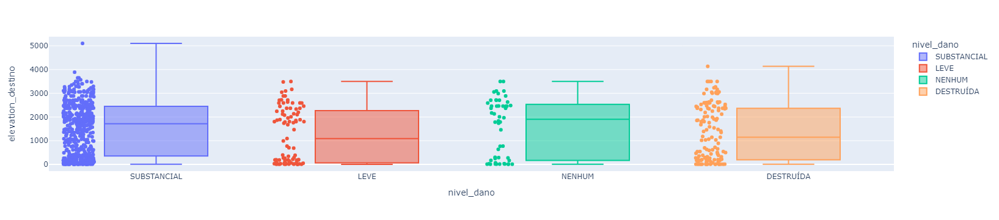

In [58]:
fig = px.box(aeronave_ocorrencia, x="nivel_dano", y="elevation_destino", points='all', color="nivel_dano")
fig.show()

#### Nível de dano X Latitude origem

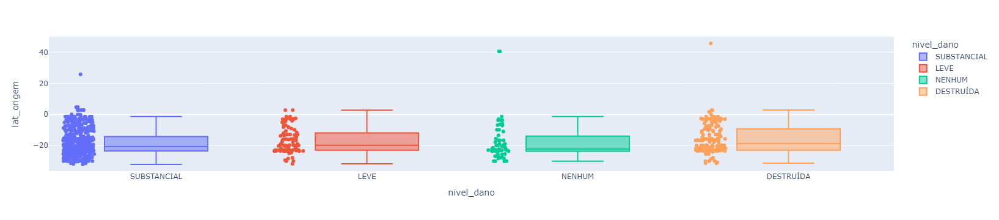

In [59]:
fig = px.box(aeronave_ocorrencia, x="nivel_dano", y="lat_origem", points="all", color="nivel_dano")
fig.show()

#### Nível de dano X Latitude destino

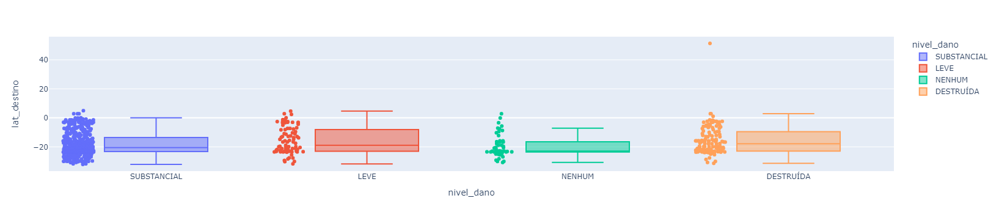

In [60]:
fig = px.box(aeronave_ocorrencia, x="nivel_dano", y="lat_destino", points="all", color="nivel_dano")
fig.show()

#### Nível de dano X Longitude origem

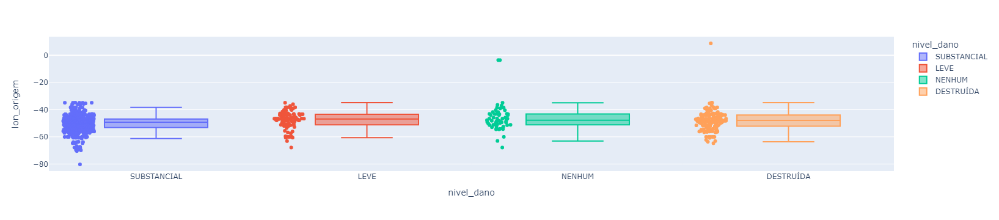

In [61]:
fig = px.box(aeronave_ocorrencia, x="nivel_dano", y="lon_origem", points="all", color="nivel_dano")
fig.show()

#### Nível de dano X Longitude destino

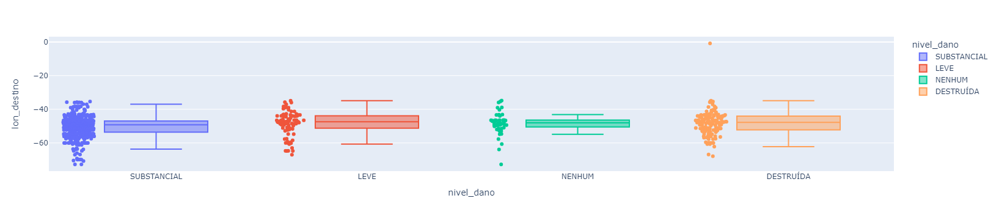

In [62]:
fig = px.box(aeronave_ocorrencia, x="nivel_dano", y="lon_destino", points="all", color="nivel_dano")
fig.show()

#### Categoria aviação X Elevação origem

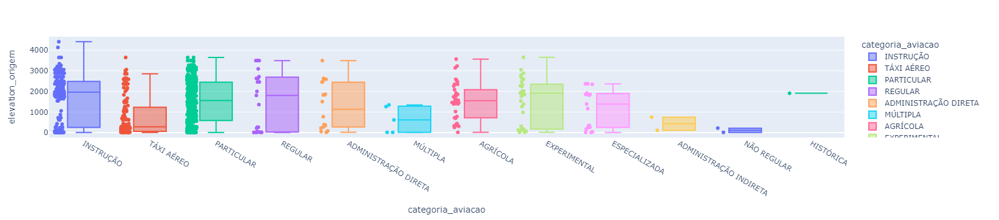

In [63]:
fig = px.box(aeronave_ocorrencia, x="categoria_aviacao", y="elevation_origem", points="all", color="categoria_aviacao")
fig.show()

#### Categoria aviação X Elevação destino

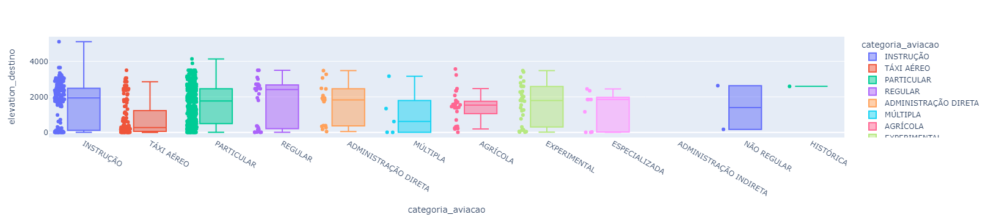

In [64]:
fig = px.box(aeronave_ocorrencia, x="categoria_aviacao", y="elevation_destino", points="all", color="categoria_aviacao")
fig.show()

#### Categoria aviação X Latitude origem

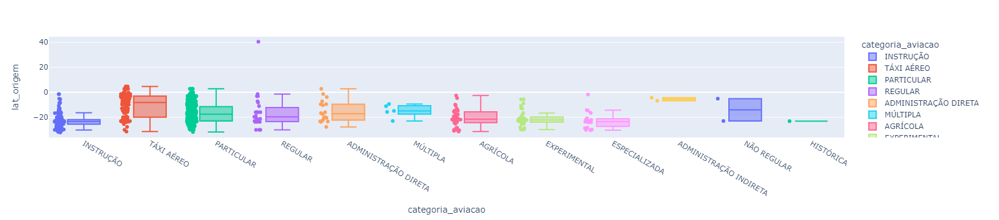

In [65]:
fig = px.box(aeronave_ocorrencia, x="categoria_aviacao", y="lat_origem", points="all", color="categoria_aviacao")
fig.show()

#### Categoria aviação X Latitude destino

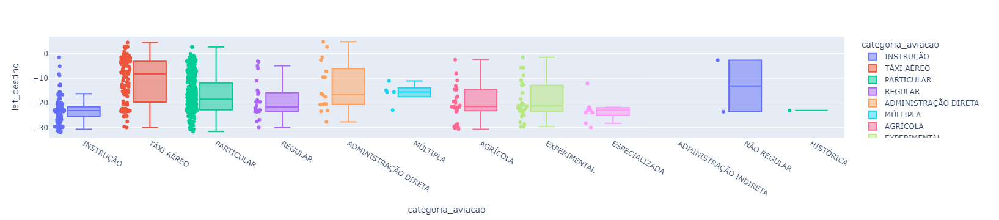

In [66]:
fig = px.box(aeronave_ocorrencia, x="categoria_aviacao", y="lat_destino", points="all", color="categoria_aviacao")
fig.show()

#### Categoria aviação X Longitude origem

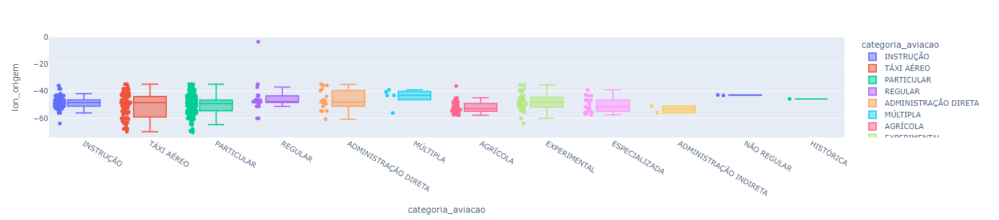

In [67]:
fig = px.box(aeronave_ocorrencia, x="categoria_aviacao", y="lon_origem", points="all", color="categoria_aviacao")
fig.show()

#### Categoria aviação X Longitude destino

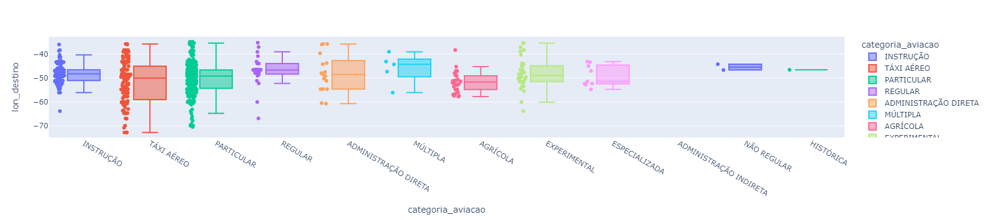

In [68]:
fig = px.box(aeronave_ocorrencia, x="categoria_aviacao", y="lon_destino", points="all", color="categoria_aviacao")
fig.show()

___
# Análise Multivariada

In [69]:
for i in list(aeronave_ocorrencia.columns):
    if aeronave_ocorrencia[i].nunique() < 3:
        print(i)

dia_extracao
classificacao
sera_investigada
relatorio_publicado
saida_pista


In [70]:
# Binary encoding

#aeronave_ocorrencia['classificacao'] = aeronave_ocorrencia['classificacao'].map({'ACIDENTE': 0, 'INCIDENTE GRAVE': 1})
aeronave_ocorrencia['sera_investigada'] = aeronave_ocorrencia['sera_investigada'].map({'NÃSO': 0, 'SIM': 1})

In [71]:
aeronave_ocorrencia['codigo_aeronave'] = aeronave_ocorrencia['codigo_aeronave'].astype(int)
aeronave_ocorrencia['codigo_ocorrencia'] = aeronave_ocorrencia['codigo_ocorrencia'].astype(int)
aeronave_ocorrencia['codigo_operador'] = aeronave_ocorrencia['codigo_operador'].astype(int)
aeronave_ocorrencia['quantidade_motores'] = aeronave_ocorrencia['quantidade_motores'].astype(float)
aeronave_ocorrencia['peso_maximo_decolagem'] = aeronave_ocorrencia['peso_maximo_decolagem'].astype(int)
aeronave_ocorrencia['quantidade_assentos'] = aeronave_ocorrencia['quantidade_assentos'].astype(float)
aeronave_ocorrencia['ano_fabricacao'] = aeronave_ocorrencia['ano_fabricacao'].astype(float)
aeronave_ocorrencia['elevation_origem'] = aeronave_ocorrencia['elevation_origem'].astype(float)
aeronave_ocorrencia['lat_origem'] = aeronave_ocorrencia['lat_origem'].astype(float)
aeronave_ocorrencia['lon_origem'] = aeronave_ocorrencia['lon_origem'].astype(float)
aeronave_ocorrencia['elevation_destino'] = aeronave_ocorrencia['elevation_destino'].astype(float)
aeronave_ocorrencia['lat_destino'] = aeronave_ocorrencia['lat_destino'].astype(float)
aeronave_ocorrencia['lon_destino'] = aeronave_ocorrencia['lon_destino'].astype(float)
aeronave_ocorrencia['distancia'] = aeronave_ocorrencia['distancia'].astype(float)
#aeronave_ocorrencia['classificacao'] = aeronave_ocorrencia['classificacao'].astype(float)
aeronave_ocorrencia['sera_investigada'] = aeronave_ocorrencia['sera_investigada'].astype(float)
aeronave_ocorrencia['relatorio_publicado'] = aeronave_ocorrencia['relatorio_publicado'].astype(float)
aeronave_ocorrencia['quantidade_recomendacoes'] = aeronave_ocorrencia['quantidade_recomendacoes'].astype(float)
aeronave_ocorrencia['aeronaves_envolvidas'] = aeronave_ocorrencia['aeronaves_envolvidas'].astype(int)
aeronave_ocorrencia['saida_pista'] = aeronave_ocorrencia['saida_pista'].astype(float)
aeronave_ocorrencia['mes_ocorrencia'] = aeronave_ocorrencia['mes_ocorrencia'].astype(int)
aeronave_ocorrencia['ano_ocorrencia'] = aeronave_ocorrencia['ano_ocorrencia'].astype(int)

In [72]:
def cramers_heatmap(df: pd.DataFrame): 
    """
        Atributos:
            - Dataframe com todos os dados
    """
    # Cálculo do coeficiente V de Cramer
    corr_matrix = np.zeros((len(df.columns), len(df.columns)))
    for i, var1 in enumerate(df.columns):
        for j, var2 in enumerate(df.columns):
            contingency_table = pd.crosstab(df[var1], df[var2])
            chi2, _, _, _ = stats.chi2_contingency(contingency_table)
            n = contingency_table.values.sum()
            k = min(contingency_table.shape[0], contingency_table.shape[1])
            corr_matrix[i, j] = np.sqrt(chi2 / (n * (k - 1)))

    # Definindo as dimensões do heatmap
    fig, ax = plt.subplots(figsize=(32, 32))
    sns.set(font_scale=1)

    # Define a máscara para o upper triangle
    mask = np.zeros_like(corr_matrix, dtype=bool)
    mask[np.triu_indices_from(mask)] = True
    sns.heatmap(corr_matrix, annot=True, xticklabels=df.columns, yticklabels=df.columns, cmap='BrBG', vmin=0, vmax=1, mask=mask)
    plt.show()

### Coeficiente V de Cramer

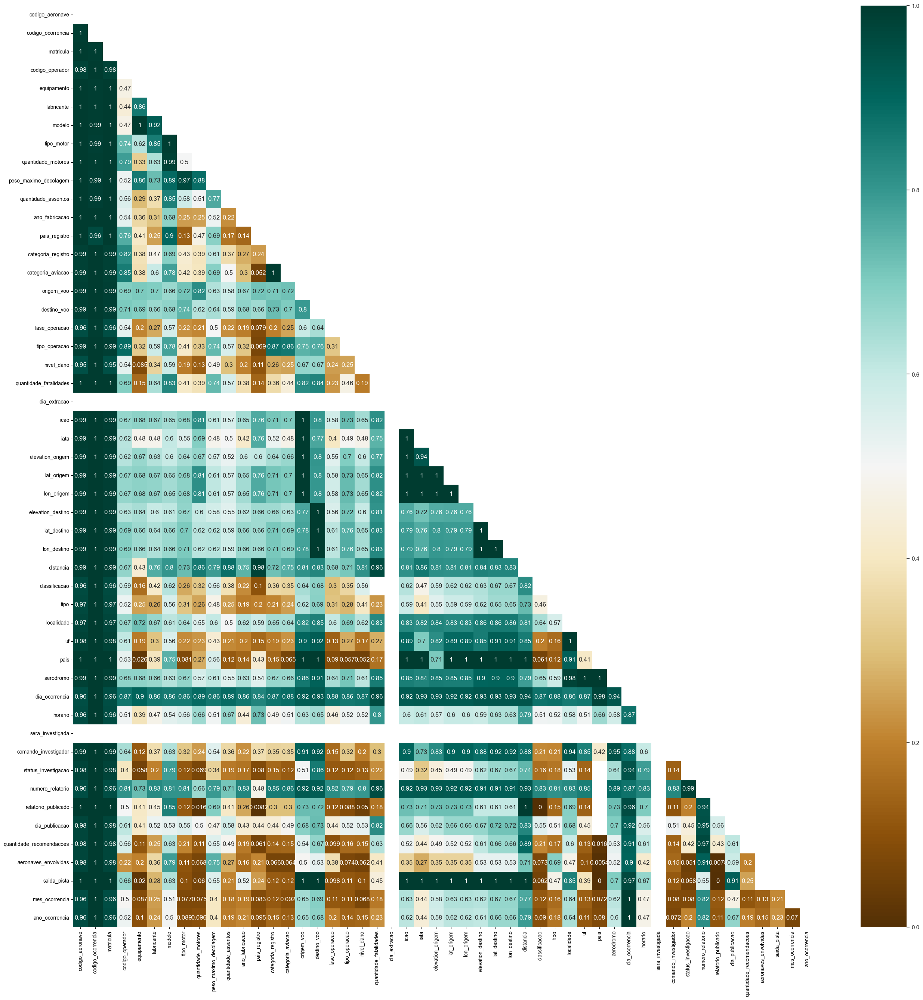

In [73]:
cramers_heatmap(aeronave_ocorrencia)

Embora a correlação de Cramer's V seja uma métrica útil para medir a associação entre variáveis categóricas, há situações em que ela pode não ser adequada ou precisa. Aqui estão algumas situações em que o uso de Cramer's V pode ser problemático:

- Tamanho da amostra: se a amostra for muito pequena, a correlação de Cramer's V pode não ser confiável. É importante lembrar que a correlação é baseada em frequências observadas, e se as frequências forem muito baixas, a correlação pode ser afetada por flutuações aleatórias.

- Variáveis com muitas categorias: se as variáveis categóricas tiverem muitas categorias, a correlação de Cramer's V pode não ser tão informativa. Isso ocorre porque a matriz de contingência pode ficar muito grande e as células com poucas observações podem prejudicar a precisão da medida.

- Dados não balanceados: se as frequências das categorias forem muito desequilibradas, a correlação de Cramer's V pode ser afetada. Nesses casos, pode ser necessário considerar outras medidas de associação, como a razão de chances ou o coeficiente de contingência.

- Variáveis ordinais: se as variáveis categóricas forem ordinais, ou seja, tiverem uma ordem natural, Cramer's V pode não ser a melhor medida de associação. Em vez disso, pode ser mais apropriado usar o coeficiente de correlação de Spearman ou Kendall.

___ 

### One hot encoder é inviável nesse caso. Foi testado e o dataset final forneceu 6377 colunas.

In [74]:
# Variáveis categóricas do dataset
cat_columns = aeronave_ocorrencia.select_dtypes(include=['object']).columns

In [75]:
from sklearn.preprocessing import OneHotEncoder

# Cria o objeto do OneHotEncoder
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

# Ajusta e transforma os dados
encoded_data = encoder.fit_transform(aeronave_ocorrencia[cat_columns])

# Cria os nomes das novas colunas
new_columns = encoder.get_feature_names_out(cat_columns)

# Cria um DataFrame com os dados codificados
encoded_df = pd.DataFrame(encoded_data, columns=new_columns)

# Concatena os DataFrames codificados com as colunas não categóricas
aeronave_ocorrencia_ohe = pd.concat([aeronave_ocorrencia.drop(cat_columns, axis=1), encoded_df], axis=1)

In [76]:
from sklearn.preprocessing import LabelEncoder

# Instancie o LabelEncoder
le = LabelEncoder()

for i in cat_columns:
    # Ajuste e transforme os dados
    aeronave_ocorrencia[i] = le.fit_transform(aeronave_ocorrencia[i])

### Correlação de Pearson

In [77]:
def pearson_correlacao(df: pd.DataFrame, type='pearson'):
    
    # Calcula as correlações
    correlacoes = df.corr(method=type)

    # Definindo variáveis
    fig, ax = plt.subplots()

    # Configurando figura
    ax.figure.set_size_inches(40, 40)
    mask = np.triu(np.ones_like(correlacoes, dtype=bool))
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Configurando o heatmap
    sns.heatmap(correlacoes, cmap="crest", mask=mask, linewidths=.5, annot=True)
    plt.title('Correlações', fontsize=16)
    plt.show()

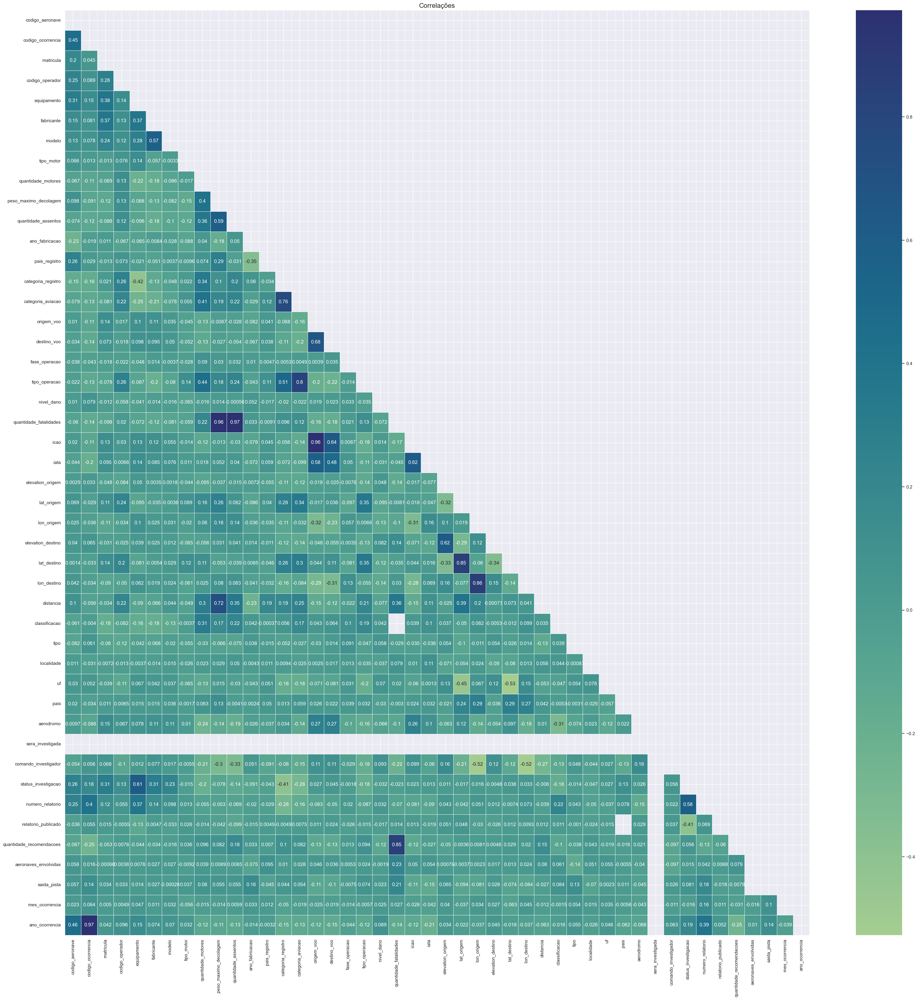

In [78]:
pearson_correlacao(aeronave_ocorrencia, 'pearson')

### Correlação de Spearman

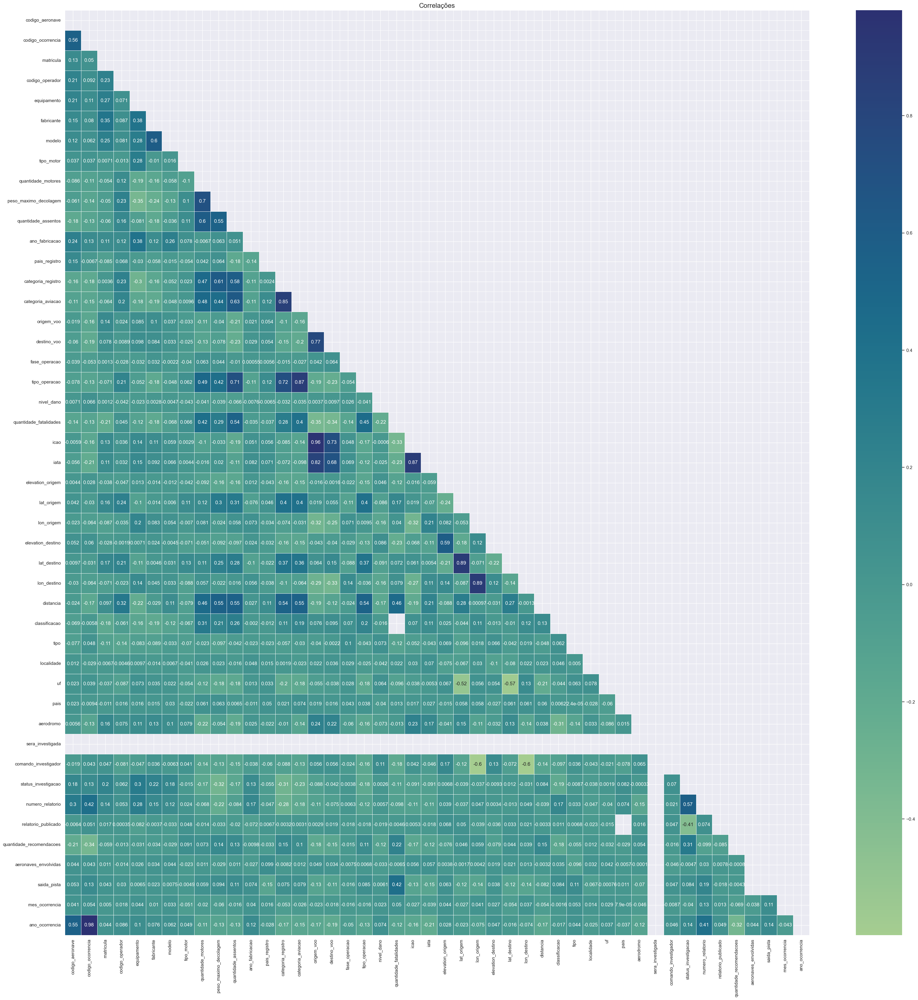

In [79]:
pearson_correlacao(aeronave_ocorrencia, 'spearman')

____

# Como não foi fornecida a informação se a base de dados trata-se de toda a população de incidentes de aeronaves ou se é uma amostra, optou-se por realizar os testes de hipóteses. Optou-se por esse teste por ser recomendado para variáveis categóricas, a base de dados possui variáveis categóricas em grande parte.

# Hipóteses

- Primeira hipótese: Existe associação entre categoria e a classificação do acidente.

- Segunda hipótese: Existe associação entre o ano de fabricação e a classificação do acidente.

- Terceira hipótese: Existe associação entre o tipo de operação e o tipo de dano.

- Quarta hipótese: Existe associação entre o tipo de operação e o nível de dano.

- Quinta hipótese: Existe associação entre o fabricante e o nível de dano.

- Sexta hipótese: Existe associação entre o fabricante e a classificação do acidente.

# Requisitos pro teste Qui-quadrado

- Os níveis (ou categorias) das variáveis são mutuamente exclusivos. Ex: um registro de incidente não pode ter 2 ou mais classificações de acidente, assim como 2 ou mais categorias de aviação. As observações não podem estar em dois ou mais grupos diferentes.

- Duas variáveis qualitativas com dois ou mais níveis cada. Ex: Nenhuma variável pode ter menos que 2 cartegorias, caso contrário não existe variabilidade.

- As unidades de observação não são pareadas.

- O valor esperado das células deve ser 5 ou mais em pelo menos 80% das células, e nenhuma célula pode ter um valor esperado menor que um.

In [80]:
alpha = 0.05

In [81]:
def teste_qui_quadrado(df: pd.DataFrame, variaveis: list) -> float:
    """
        Atributos:
            - Dataframe com todos os dados
            - Lista das variáveis a serem analisadas
        Saída:
            - Valor de p
    """
    # Criando tabela de frequências
    tabela_contingencia = pd.crosstab(aeronave_ocorrencia[variaveis[0]], aeronave_ocorrencia[variaveis[1]])
    
    # Gerando resultado do teste
    resultado = stats.chi2_contingency(tabela_contingencia)
    
    print(f'chi2: {resultado.statistic}')
   
    return resultado.pvalue

### Primeira hipótese

- H0: Não existe associação entre categoria e a classificação do acidente.

- H1: Existe associação entre categoria e a classificação do acidente.

In [82]:
h0 = 'Não existe associação entre categoria e a classificação do acidente.'
h1 = 'Existe associação entre categoria e a classificação do acidente.'

In [83]:
# Relembrando a tabela
pd.crosstab(aeronave_ocorrencia['categoria_aviacao'] , aeronave_ocorrencia['classificacao'])

classificacao,0,1
categoria_aviacao,,
0,32,13
1,4,3
2,184,12
3,52,12
4,178,24
5,1,0
6,232,138
7,8,3
8,0,5


### O teste demonstrou que a hipótese nula deve ser rejeitada, ou seja, a categoria de aviação possui influência na classificação do acidente
​

In [84]:
valor_p = teste_qui_quadrado(aeronave_ocorrencia, ['categoria_aviacao', 'classificacao'])
print(f'Valor de p: {valor_p}')

if valor_p <= alpha:
    print('A hipótese nula foi rejeitada')
    print(h1)
else:
    print('A hipótese alternativa foi rejeitada')
    print(h0)

chi2: 251.27081588141067
Valor de p: 7.431991506179781e-47
A hipótese nula foi rejeitada
Existe associação entre categoria e a classificação do acidente.


### Segunda hipótese

- H0: Não existe associação entre o ano de fabricação a a classificação do acidente.

- H1: Existe associação entre o ano de fabricação a a classificação do acidente.

In [85]:
h0 = 'Não existe associação entre o ano de fabricação a a classificação do acidente.'
h1 = 'Existe associação entre o ano de fabricação a a classificação do acidente.'

In [86]:
aeronave_ocorrencia['ano_fabricacao'] = aeronave_ocorrencia['ano_fabricacao'].astype('object')

In [87]:
# Relembrando a tabela
pd.crosstab(aeronave_ocorrencia['ano_fabricacao'] , aeronave_ocorrencia['classificacao'])

classificacao,0,1
ano_fabricacao,,
0.0,71,16
1936.0,1,0
1940.0,1,1
1942.0,1,0
1945.0,1,0
...,...,...
2011.0,29,8
2012.0,32,9
2013.0,11,3


### O teste demonstrou que a hipótese nula deve mantida, ou seja, o ano de fabricação não tem influência na classificação do acidente

In [88]:
valor_p = teste_qui_quadrado(aeronave_ocorrencia, ['ano_fabricacao', 'classificacao'])
print(f'Valor de p: {valor_p}')

if valor_p <= alpha:
    print('A hipótese nula foi rejeitada')
    print(h1)
else:
    print('A hipótese alternativa foi rejeitada')
    print(h0)

chi2: 94.43149108541286
Valor de p: 0.05485450079751537
A hipótese alternativa foi rejeitada
Não existe associação entre o ano de fabricação a a classificação do acidente.


### Terceira hipótese

- H0: Não existe associação entre o tipo de operação e o tipo de dano.

- H1: Existe associação entre o tipo de operação e o tipo de dano.

In [89]:
h0 = 'Não existe associação entre o tipo de operação e o tipo de dano.'
h1 = 'Existe associação entre o tipo de operação e o tipo de dano.'

In [90]:
# Relembrando a tabela
pd.crosstab(aeronave_ocorrencia['tipo_operacao'] , aeronave_ocorrencia['tipo'])

tipo,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48
tipo_operacao,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,3,0,5,0,4,0,0,0,0,45,0,1,0,0,0,0,0,2,0,0,1,1,3,52,0,1,0,0,0,0,0,5,14,6,9,3,0,75,30,1,0,3,1,0,0,0,0,1
1,1,0,0,0,0,1,0,0,0,0,2,1,0,0,0,0,0,0,1,0,0,0,0,0,11,0,0,0,0,0,0,0,1,1,2,6,0,0,9,5,0,0,0,0,0,1,0,0,0
2,0,2,1,0,3,2,0,5,0,0,8,3,1,0,0,0,0,0,9,0,0,0,0,8,21,0,1,0,0,1,0,0,16,0,11,3,2,1,32,14,1,3,3,1,0,0,0,1,0
3,0,3,1,0,0,3,1,0,1,0,14,2,2,0,0,0,0,0,12,2,0,2,1,6,67,0,1,0,0,1,0,0,6,0,5,8,4,2,45,139,3,18,4,2,6,0,1,4,0
4,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,2,0,0,0,0,0,0,0,0,0,1,2,0,0,4,0,1,0,0,1,1,0,0,0,0
5,0,0,0,1,0,1,0,0,0,0,5,0,0,1,0,2,0,0,6,0,0,0,0,2,5,0,0,0,0,0,0,0,0,0,3,1,0,0,5,3,0,0,1,0,1,0,0,0,0
6,0,6,1,13,7,18,3,6,0,0,55,1,5,0,1,0,1,3,64,1,0,5,5,22,146,2,3,0,0,3,0,1,23,1,34,42,8,1,113,95,5,10,20,13,33,0,2,2,1
7,0,10,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,0,5,0,8,0,1,8,9,0,0,0,4,0,0,0,0,0,7,2,2,0,3,9,3,1,5,5,0,0,2,2,2
8,0,2,0,2,4,9,1,0,0,1,12,1,2,0,0,0,4,0,31,0,1,2,4,11,58,0,1,1,3,2,1,0,4,0,12,1,7,1,24,28,1,8,7,7,13,1,0,4,2


In [91]:
valor_p = teste_qui_quadrado(aeronave_ocorrencia, ['tipo_operacao', 'tipo'])
print(f'Valor de p: {valor_p}')

if valor_p <= alpha:
    print('A hipótese nula foi rejeitada')
    print(h1)
else:
    print('A hipótese alternativa foi rejeitada')
    print(h0)

chi2: 1426.2039759901352
Valor de p: 1.661010145356768e-106
A hipótese nula foi rejeitada
Existe associação entre o tipo de operação e o tipo de dano.


### Quarta hipótese

- H0: Não existe associação entre o tipo de operação e o nível de dano.

- H1: Existe associação entre o tipo de operação e o nível de dano.

In [92]:
h0 = 'Não existe associação entre o tipo de operação e o nível de dano.'
h1 = 'Existe associação entre o tipo de operação e o nível de dano.'

In [93]:
# Relembrando a tabela
pd.crosstab(aeronave_ocorrencia['tipo_operacao'] , aeronave_ocorrencia['nivel_dano'])

nivel_dano,0,1,2,3,4
tipo_operacao,,,,,
0,56,14,6,187,3
1,4,8,5,24,1
2,42,18,10,81,2
3,22,63,33,236,12
4,1,3,1,9,0
5,6,6,4,21,0
6,172,79,36,468,20
7,5,18,43,9,16
8,38,49,27,147,12


In [94]:
valor_p = teste_qui_quadrado(aeronave_ocorrencia, ['tipo_operacao', 'nivel_dano'])
print(f'Valor de p: {valor_p}')

if valor_p <= alpha:
    print('A hipótese nula foi rejeitada')
    print(h1)
else:
    print('A hipótese alternativa foi rejeitada')
    print(h0)

chi2: 408.2400284075044
Valor de p: 1.2774610025184969e-64
A hipótese nula foi rejeitada
Existe associação entre o tipo de operação e o nível de dano.


### Quinta hipótese

- H0: Não existe associação entre o fabricante e o nível de dano.

- H1: Existe associação entre o fabricante e o nível de dano.

In [95]:
h0 = 'Não existe associação entre o fabricante e o nível de dano.'
h1 = 'Existe associação entre o fabricante e o nível de dano.'

In [96]:
# Relembrando a tabela
pd.crosstab(aeronave_ocorrencia['fabricante'] , aeronave_ocorrencia['nivel_dano'])

nivel_dano,0,1,2,3,4
fabricante,,,,,
0,2,22,10,85,7
1,0,0,0,1,0
2,0,0,0,2,0
3,1,0,0,0,0
4,0,6,0,6,0
...,...,...,...,...,...
115,0,0,0,2,0
116,0,0,0,1,0
117,1,0,0,0,0


In [97]:
valor_p = teste_qui_quadrado(aeronave_ocorrencia, ['fabricante', 'nivel_dano'])
print(f'Valor de p: {valor_p}')

if valor_p <= alpha:
    print('A hipótese nula foi rejeitada')
    print(h1)
else:
    print('A hipótese alternativa foi rejeitada')
    print(h0)

chi2: 797.3722514828844
Valor de p: 1.3072539946147695e-18
A hipótese nula foi rejeitada
Existe associação entre o fabricante e o nível de dano.


### Sexta hipótese

- H0: Não existe associação entre o fabricante e a classificação do acidente.

- H1: Existe associação entre o fabricante e a classificação do acidente.

In [98]:
h0 = 'Não existe associação entre o fabricante e a classificação do acidente.'
h1 = 'Existe associação entre o fabricante e a classificação do acidente.'

In [99]:
# Relembrando a tabela
pd.crosstab(aeronave_ocorrencia['fabricante'] , aeronave_ocorrencia['classificacao'])

classificacao,0,1
fabricante,,
0,63,63
1,1,0
2,2,0
3,1,0
4,8,4
...,...,...
115,2,0
116,1,0
117,1,0


In [100]:
valor_p = teste_qui_quadrado(aeronave_ocorrencia, ['fabricante', 'classificacao'])
print(f'Valor de p: {valor_p}')

if valor_p <= alpha:
    print('A hipótese nula foi rejeitada')
    print(h1)
else:
    print('A hipótese alternativa foi rejeitada')
    print(h0)

chi2: 361.07035241181046
Valor de p: 3.28225758492601e-26
A hipótese nula foi rejeitada
Existe associação entre o fabricante e a classificação do acidente.


___

# Conclusões

Inconsistências
- Existe aeronaves de pequeno e grande porte que constam como não possuírem assentos. Ao pesquisar alguns desses modelos na internet, comprovou-se que isso não é verdade.

Constatações

- As 3 principais causas de acidente somadas chegam a praticamente 50% dos incidentes.

- Ao longo dos anos a quantidade de viagens de avião cresceu e por consequência os desastres. 

- O mês de junho possui queda nas viagens segundo informações coletadas e isso se refletiu no gráfico de séries temporais dos incidentes.

- A distribuição de acidentes considerando os locais de destino e origem dos voos, não demonstraram nenhuma alta concentração em local específico no mapa.


Resumo das hipóteses

- Primeira hipótese: Existe associação entre categoria e a classificação do acidente. (CONFIRMADA)

- Segunda hipótese: Existe associação entre o ano de fabricação e a classificação do acidente. (REJEITADA)

- Terceira hipótese: Existe associação entre o tipo de operação e o tipo de dano. (CONFIRMADA)

- Quarta hipótese: Existe associação entre o tipo de operação e o nível de dano. (CONFIRMADA)

- Quinta hipótese: Existe associação entre o fabricante e o nível de dano. (CONFIRMADA)

- Sexta hipótese: Existe associação entre o fabricante e a classificação do acidente. (CONFIRMADA)

Mesmo as variáveis tendo apresentado baixa correlação de Pearson ou Spearman, elas ainda podem apresentar associação significativa de acordo com o teste do qui-quadrado. Isso ocorre porque o teste do qui-quadrado leva em consideração a frequência de ocorrência conjunta das variáveis em questão, enquanto a correlação de Pearson ou Spearman avalia apenas a relação linear e não-linear entre elas.

Informações relacionadas a manutenção das aeronaves e sobre os voos que não sofreram acidente poderiam contribuir para enriquecer a análise dos dados.
___